In [1]:
import numpy as np
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.util import add_cyclic_point
from pathlib import Path

In [2]:
# model predictions for 20250923-1900
pangu_surface_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Pangu/output_24/2025-09-22-19-00to2025-09-24-19-00/surface_combined.nc")
pangu_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Pangu/output_24/2025-09-22-19-00to2025-09-24-19-00/upper_combined.nc")
graphcast_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Graphcast/output_24/2025092219/gc_operational_predict_data_4.nc")
fengwu_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Fengwu/output_24/2025-09-22-13-00_to_2025-09-22-19-00/decoded_output_3.nc")
fuxi_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Fuxi/output_24/2025092213_to_2025092219/024.nc")
aurora_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Aurora/output_24/WP/Ragasa/202509221300/20250923_190000.nc")

C:\Users\HF.DESKTOP-QSN0631\AppData\Local\Temp\ipykernel_25288\3302074280.py:4: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  graphcast_24h = xr.open_dataset("../../AI_forecasting_result/Ragasa/Graphcast/output_24/2025092219/gc_operational_predict_data_4.nc")


In [3]:
era5_surface = xr.open_dataset("./data/era5_surface_2025092201-2025092419.nc")
era5_850hPa = xr.open_dataset("./data/era5_850hPa_2025092201-2025092419.nc")

In [4]:
target_time = np.datetime64("2025-09-23T19:00:00")
out_dir = Path("./publish")
out_dir.mkdir(exist_ok=True)

# Global font settings for all texts in the plots
mpl.rcParams["font.family"] = "Arial"
mpl.rcParams["font.size"] = 16

model_order = ["ERA5", "Pangu", "GraphCast", "FengWu", "FuXi", "Aurora"]

var_cfg = {
    "U10": {"unit": "m s$^{-1}$"},
    "V10": {"unit": "m s$^{-1}$"},
    "MSLP": {"unit": "Pa"},
    "T2M": {"unit": "K"},
    "U850": {"unit": "m s$^{-1}$"},
    "V850": {"unit": "m s$^{-1}$"},
    "Z850": {"unit": "m$^2$ s$^{-2}$"},
    "T850": {"unit": "K"},
}


def _squeeze_2d(da):
    drop_dims = [d for d in da.dims if d not in ("latitude", "longitude", "lat", "lon")]
    if drop_dims:
        da = da.isel({d: 0 for d in drop_dims})
    return da


def _select_time(da):
    for tname in ["valid_time", "time", "datetime"]:
        if tname in da.coords:
            if da[tname].ndim == 0:
                return da
            return da.sel({tname: target_time}, method="nearest")
    return da


def get_field(model_name, var_name):
    if model_name == "ERA5":
        if var_name in ["U10", "V10", "MSLP", "T2M"]:
            m = {"U10": "u10", "V10": "v10", "MSLP": "msl", "T2M": "t2m"}
            da = era5_surface[m[var_name]].sel(valid_time=target_time)
            return _squeeze_2d(da), "latitude", "longitude"
        m = {"U850": "u", "V850": "v", "Z850": "z", "T850": "t"}
        da = era5_850hPa[m[var_name]].sel(valid_time=target_time, pressure_level=850)
        return _squeeze_2d(da), "latitude", "longitude"

    if model_name == "Pangu":
        if var_name in ["U10", "V10", "MSLP", "T2M"]:
            m = {"U10": "u10", "V10": "v10", "MSLP": "msl", "T2M": "t2m"}
            da = _select_time(pangu_surface_24h[m[var_name]])
            return _squeeze_2d(da), "latitude", "longitude"
        m = {"U850": "u", "V850": "v", "Z850": "z", "T850": "t"}
        da = pangu_24h[m[var_name]].sel(valid_time=target_time, level=3)
        return _squeeze_2d(da), "latitude", "longitude"

    if model_name == "GraphCast":
        m = {
            "U10": "10m_u_component_of_wind",
            "V10": "10m_v_component_of_wind",
            "MSLP": "mean_sea_level_pressure",
            "T2M": "2m_temperature",
            "U850": "u_component_of_wind",
            "V850": "v_component_of_wind",
            "Z850": "geopotential",
            "T850": "temperature",
        }
        da = graphcast_24h[m[var_name]].isel(batch=0, time=0)
        if var_name in ["U850", "V850", "Z850", "T850"]:
            da = da.sel(level=850)
        return _squeeze_2d(da), "lat", "lon"

    if model_name == "FengWu":
        m = {
            "U10": "u10",
            "V10": "v10",
            "MSLP": "msl",
            "T2M": "t2m",
            "U850": "u850",
            "V850": "v850",
            "Z850": "z850",
            "T850": "t850",
        }
        da = fengwu_24h[m[var_name]].isel(valid_time=0)
        return _squeeze_2d(da), "latitude", "longitude"

    if model_name == "FuXi":
        level_map = {
            "U10": "U10",
            "V10": "V10",
            "MSLP": "MSL",
            "T2M": "T2M",
            "U850": "U850",
            "V850": "V850",
            "Z850": "Z850",
            "T850": "T850",
        }
        da = fuxi_24h["__xarray_dataarray_variable__"].sel(level=level_map[var_name]).isel(time=0, step=0)
        return _squeeze_2d(da), "lat", "lon"

    if model_name == "Aurora":
        m = {
            "U10": "u10",
            "V10": "v10",
            "MSLP": "msl",
            "T2M": "t2m",
            "U850": "u",
            "V850": "v",
            "Z850": "z",
            "T850": "t",
        }
        da = aurora_24h[m[var_name]]
        if var_name in ["U850", "V850", "Z850", "T850"]:
            da = da.sel(level=850)
        return _squeeze_2d(da), "lat", "lon"

    raise ValueError(f"Unknown model: {model_name}")


def plot_one_variable(var_name):
    cfg = var_cfg[var_name]
    field_by_model = {}

    for model_name in model_order:
        try:
            da, lat_name, lon_name = get_field(model_name, var_name)
            field_by_model[model_name] = (da, lat_name, lon_name)
        except Exception as exc:
            print(f"Skip {model_name} for {var_name}: {exc}")

    valid_arrays = [v[0].values for v in field_by_model.values()]
    if not valid_arrays:
        print(f"No available data for {var_name}")
        return None

    vmin = min(float(np.nanpercentile(arr, 2)) for arr in valid_arrays)
    vmax = max(float(np.nanpercentile(arr, 98)) for arr in valid_arrays)
    if np.isclose(vmin, vmax):
        vmin = min(float(np.nanmin(arr)) for arr in valid_arrays)
        vmax = max(float(np.nanmax(arr)) for arr in valid_arrays)

    fig, axes = plt.subplots(
        2,
        3,
        figsize=(16, 6.2),
        subplot_kw={"projection": ccrs.Robinson()},
        constrained_layout=False,
    )
    # Strongly compact vertical layout and reserve room for a short right colorbar.
    fig.subplots_adjust(left=0.03, right=0.88, bottom=0.07, top=0.965, wspace=0.02, hspace=0.02)

    axes = axes.ravel()
    mesh = None

    for i, model_name in enumerate(model_order):
        ax = axes[i]
        if model_name not in field_by_model:
            ax.set_global()
            ax.coastlines(linewidth=0.7)
            ax.set_title(f"{model_name} (N/A)", fontsize=16, fontname="Arial", pad=2)
            continue

        da, lat_name, lon_name = field_by_model[model_name]
        lat = da[lat_name].values
        lon = da[lon_name].values
        data = da.values

        data_cyc, lon_cyc = add_cyclic_point(data, coord=lon)
        mesh = ax.pcolormesh(
            lon_cyc,
            lat,
            data_cyc,
            transform=ccrs.PlateCarree(),
            cmap="coolwarm",
            shading="auto",
            vmin=vmin,
            vmax=vmax,
        )
        ax.set_global()
        ax.coastlines(linewidth=0.7)
        ax.set_title(model_name, fontsize=16, fontname="Arial", pad=2)

    if mesh is not None:
        # [left, bottom, width, height] in figure fraction for a shorter vertical colorbar.
        cax = fig.add_axes([0.905, 0.27, 0.014, 0.46])
        cbar = fig.colorbar(mesh, cax=cax, orientation="vertical")
        cbar.set_label(f"{var_name} ({cfg['unit']})", fontsize=16, fontname="Arial")
        cbar.ax.tick_params(labelsize=16)
        for tick_label in cbar.ax.get_yticklabels():
            tick_label.set_fontname("Arial")

    out_file = out_dir / f"{var_name.lower()}_6panel_2025092319.tif"
    fig.savefig(out_file, dpi=300, bbox_inches="tight")
    plt.show()
    plt.close(fig)
    print(f"Saved: {out_file}")
    return out_file

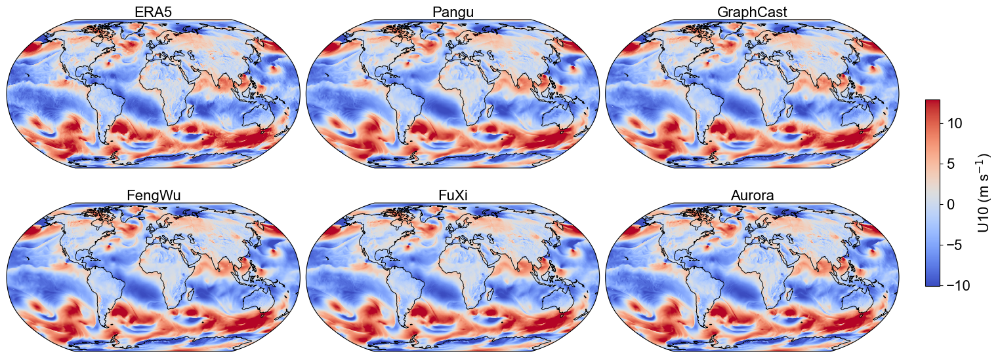

Saved: publish\u10_6panel_2025092319.tif


WindowsPath('publish/u10_6panel_2025092319.tif')

In [5]:
plot_one_variable("U10")

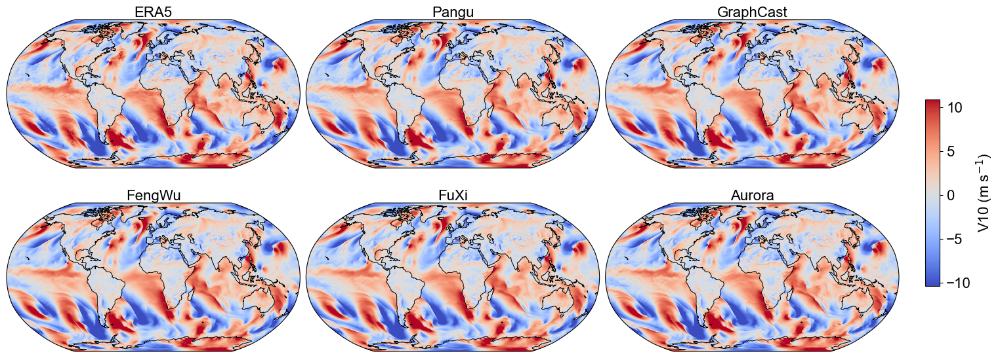

Saved: publish\v10_6panel_2025092319.tif


WindowsPath('publish/v10_6panel_2025092319.tif')

In [6]:
plot_one_variable("V10")

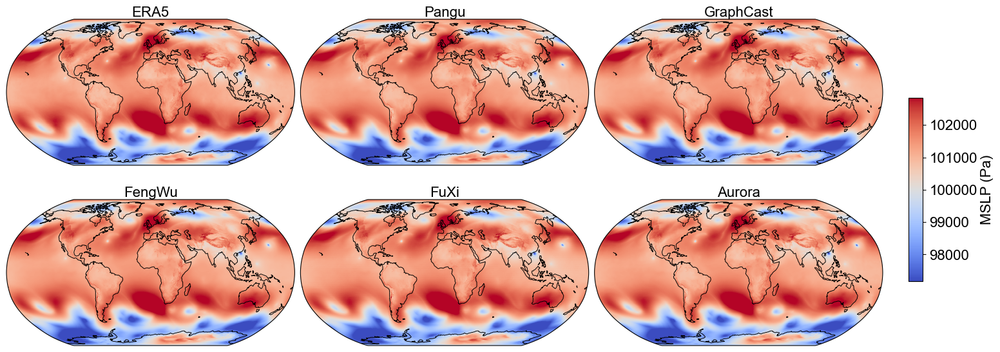

Saved: publish\mslp_6panel_2025092319.tif


WindowsPath('publish/mslp_6panel_2025092319.tif')

In [7]:
plot_one_variable("MSLP")

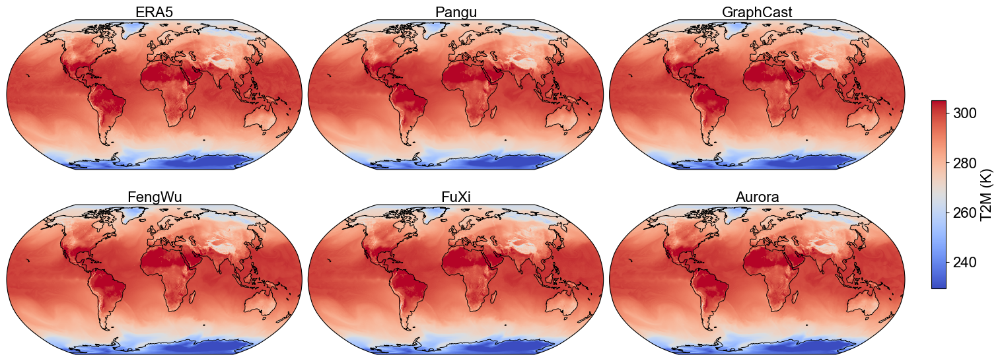

Saved: publish\t2m_6panel_2025092319.tif


WindowsPath('publish/t2m_6panel_2025092319.tif')

In [8]:
plot_one_variable("T2M")

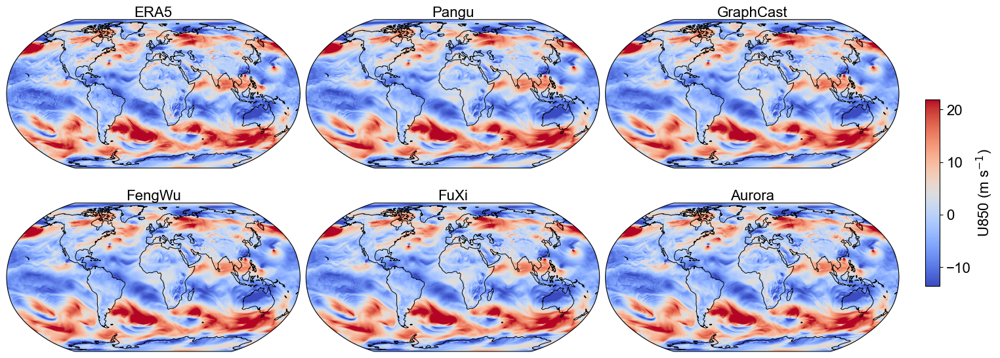

Saved: publish\u850_6panel_2025092319.tif


WindowsPath('publish/u850_6panel_2025092319.tif')

In [9]:
plot_one_variable("U850")

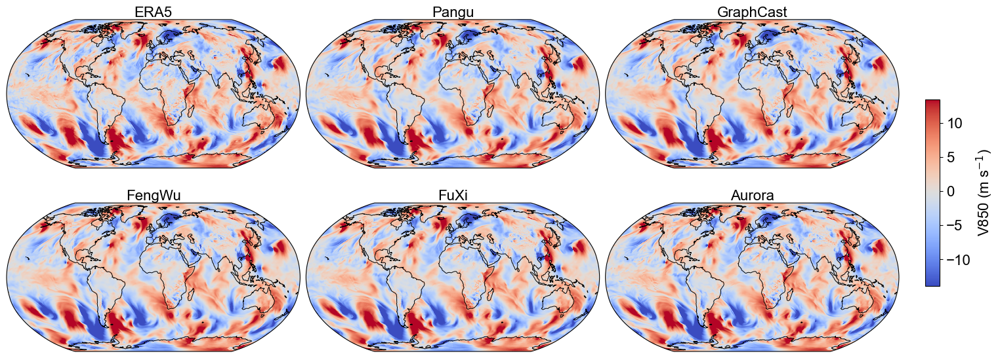

Saved: publish\v850_6panel_2025092319.tif


WindowsPath('publish/v850_6panel_2025092319.tif')

In [10]:
plot_one_variable("V850")

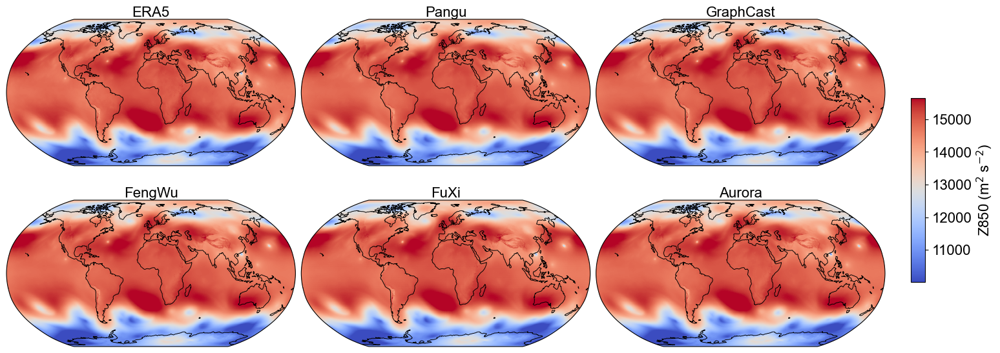

Saved: publish\z850_6panel_2025092319.tif


WindowsPath('publish/z850_6panel_2025092319.tif')

In [11]:
plot_one_variable("Z850")

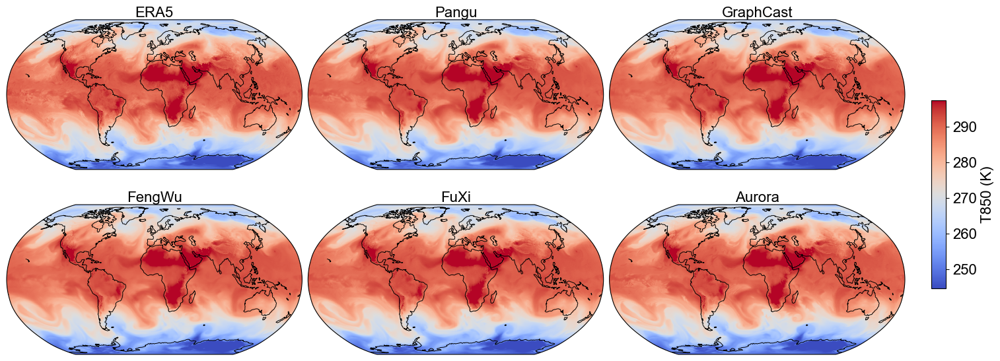

Saved: publish\t850_6panel_2025092319.tif


WindowsPath('publish/t850_6panel_2025092319.tif')

In [12]:
plot_one_variable("T850")